In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as pl

In [2]:
# Discirminator
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d): # channel_img - channels of input images; features_d - output channels number of the first layer
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # Input channel_img x 64 x 64 (3 x 64 x 64)
            # First layer
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1), # input: channels_img x 64 x 64; output: features_d x 32 x 32
            nn.LeakyReLU(0.2),

            # Middle layers
            self._block(features_d, features_d * 2, 4, 2, 1), # input: features_d x 32 x 32; output features_d*2 x 16 x 16
            self._block(features_d * 2, features_d * 4, 4, 2, 1), # input: features_d*2 x 16 x 16; output features_d*4 x 8 x 8
            self._block(features_d * 4, features_d * 8, 4, 2, 1), # input: features_d*4 x 8 x 8; output features_d*8 x 4 x 4

            # Last layer
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0), # input features_d*8 x 4 x 4; ouptut 1 x 1 x 1
            nn.Sigmoid() # Output a number between 0 and 1 (fake/real)
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False), # Conv layer
            nn.BatchNorm2d(out_channels), # Batchnorm on the Conv output
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
      return self.disc(x)

In [3]:
# Generator
class Generator(nn.Module):
  def __init__(self, z_dim, channels_img, features_g): # channels_img - input image channel; features_g - output image channel of the first layer
    super(Generator, self).__init__()
    self.gen = nn.Sequential(
        # Input - z_dim x 1 x 1
        # Middle layers
        self._block(z_dim, features_g*16, kernel_size=4, stride=1, padding=0), # input: z_dim x 1 x 1; output: features_g*16 x 4 x 4
        self._block(features_g*16, features_g*8, kernel_size=4, stride=2, padding=1), # input: features_g*16 x 4 x 4; output: features_g*8 x 8 x 8
        self._block(features_g*8, features_g*4, kernel_size=4, stride=2, padding=1), # input: features_g*8 x 8 x 8; output: features_g*4 x 16 x 16
        self._block(features_g*4, features_g*2, kernel_size=4, stride=2, padding=1), # input: features_g*4 x 16 x 16; output: features_g*2 x 32 x 32

        # Last layer
        nn.ConvTranspose2d(features_g*2, channels_img, kernel_size=4, stride=2, padding=1), # input: features_g*2 x 32 x 32; output: channels_img x 64 x 64
        nn.Tanh() # Normalize pixel to [-1, 1]
    )

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    return nn.Sequential(
      nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
      nn.BatchNorm2d(out_channels),
      nn.ReLU()
    )

  def forward(self, x):
    return self.gen(x)

In [4]:
# Initialize the weight
def initialize_weights(model):
  for m in model.modules(): # Loop through all the layers in the model
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)): # Check if the layer is Conv2d, ConvTranspose2d, or Batchnormr2d
      nn.init.normal_(m.weight.data, 0.0, 0.02) # If yes, we initlize the layer with mean of 0 and std of 0.02

# Initializing weights helps GAN to have more stable training process

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [6]:
# Setup hyperparameters (Try for MNIST first)
lr = 2e-4
BATCH_SIZE = 128
img_size = 64
channel_imgs = 3
z_dim = 100
epochs = 15
features_d = 64
features_g = 64

In [7]:
# Transform
transformer = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.5 for _ in range(channel_imgs)], [0.5 for _ in range(channel_imgs)]) # Normalize with mean and std of 0.5 for each channel
    # This is the same as "transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])"
])

## Dataset
CelebA dataset downloaded from https://www.kaggleusercontent.com/datasets/504743cb487a5aed565ce14238c6343b7d650ffd28c071f03f2fd9b25819e6c9/dataset.zip

Contains 202,599 face images

In [8]:
datapath = "drive/MyDrive/Colab Notebooks/Pytorch/DCGAN_Celeb/data"

In [3]:
import requests
import zipfile
import os

# URL of the dataset
# url = "https://www.kaggleusercontent.com/datasets/504743cb487a5aed565ce14238c6343b7d650ffd28c071f03f2fd9b25819e6c9/dataset.zip"
file_path = os.path.join(datapath, "archive.zip")

# Extract the zip file
print("Extracting dataset...")
with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall(datapath)
print(f"Dataset extracted to {datapath}")

Extracting dataset...
Dataset extracted to drive/MyDrive/Colab Notebooks/Pytorch/DCGAN_Celeb/data


In [9]:
# Dataloader (Only need training)
dataset = datasets.ImageFolder(root=datapath, transform=transformer)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
print(len(dataloader))

151


In [10]:
# Set up model
disc = Discriminator(channel_imgs, features_d).to(device)
gen = Generator(z_dim, channel_imgs, features_g).to(device)
initialize_weights(disc)
initialize_weights(gen)

In [11]:
# Loss function and optimizer
loss_fn = nn.BCELoss()
optimizer_disc = optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999)) # weighte parameter
optimizer_gen = optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))

In [12]:
# Fixed noise
fixed_noise = torch.randn(32, z_dim, 1, 1).to(device)

In [13]:
# Writers
writer_fake = SummaryWriter(f"runs/GAN_MNIST/fake")
writer_real = SummaryWriter(f"runs/GAN_MNIST/real")

In [14]:
from tqdm import tqdm

for epoch in tqdm(range(epochs)):
  for batch_idx, (real, _) in enumerate(dataloader):
    real = real.to(device) # Get real sample
    noise = torch.randn((BATCH_SIZE, z_dim, 1, 1)).to(device) # Generate fake noise - size (128, 100, 1, 1)
    fake = gen(noise) # Generate fake data - size (128, 1, 64, 64)

    # Train discriminator
    disc_real = disc(real).reshape(-1) # Get predictions on real data - size (128)
    disc_fake = disc(fake.detach()).reshape(-1) # Get predictions on fake data - size (128)
    disc_real_loss = loss_fn(disc_real, torch.ones_like(disc_real)) # Get real loss
    disc_fake_loss = loss_fn(disc_fake, torch.zeros_like(disc_fake)) # Get fake loss
    disc_loss = (disc_real_loss + disc_fake_loss) / 2 # Calculate total loss for discriminator

    disc.zero_grad()
    disc_loss.backward()
    optimizer_disc.step()

    # Train the generator
    output = disc(fake).reshape(-1) # Discriminator prediction on fake data
    gen_loss = loss_fn(output, torch.ones_like(output)) # Get generator loss
    gen.zero_grad()
    gen_loss.backward()
    optimizer_gen.step()

    if batch_idx == 0:
      print(
          f"Epoch [{epoch}/{epochs}] Batch {batch_idx}/{len(dataloader)} \
          Loss D: {disc_loss:.4f}, loss G: {gen_loss:.4f}"
      )
      with torch.no_grad():
        fake = gen(fixed_noise) # Reshape images
        img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
        img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)

        writer_fake.add_image("Fake", img_grid_fake, global_step=epoch)
        writer_real.add_image("Real", img_grid_real, global_step=epoch)

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [0/15] Batch 0/151           Loss D: 0.6871, loss G: 0.8068


  7%|▋         | 1/15 [05:40<1:19:28, 340.60s/it]

Epoch [1/15] Batch 0/151           Loss D: 0.3852, loss G: 1.0795


 13%|█▎        | 2/15 [06:38<37:44, 174.19s/it]  

Epoch [2/15] Batch 0/151           Loss D: 0.5797, loss G: 1.7485


 20%|██        | 3/15 [07:36<24:12, 121.08s/it]

Epoch [3/15] Batch 0/151           Loss D: 0.6222, loss G: 2.0465


 27%|██▋       | 4/15 [08:34<17:38, 96.22s/it] 

Epoch [4/15] Batch 0/151           Loss D: 0.5805, loss G: 2.0188


 33%|███▎      | 5/15 [09:31<13:41, 82.14s/it]

Epoch [5/15] Batch 0/151           Loss D: 0.5867, loss G: 1.4637


 40%|████      | 6/15 [10:28<11:03, 73.70s/it]

Epoch [6/15] Batch 0/151           Loss D: 0.5056, loss G: 2.2637


 47%|████▋     | 7/15 [11:26<09:07, 68.40s/it]

Epoch [7/15] Batch 0/151           Loss D: 0.5679, loss G: 1.5410


 53%|█████▎    | 8/15 [12:22<07:32, 64.68s/it]

Epoch [8/15] Batch 0/151           Loss D: 0.5737, loss G: 1.5901


 60%|██████    | 9/15 [13:21<06:15, 62.64s/it]

Epoch [9/15] Batch 0/151           Loss D: 0.5599, loss G: 1.3353


 67%|██████▋   | 10/15 [14:17<05:03, 60.64s/it]

Epoch [10/15] Batch 0/151           Loss D: 0.5739, loss G: 1.0440


 73%|███████▎  | 11/15 [15:14<03:58, 59.63s/it]

Epoch [11/15] Batch 0/151           Loss D: 0.4593, loss G: 2.4644


 80%|████████  | 12/15 [16:11<02:56, 58.91s/it]

Epoch [12/15] Batch 0/151           Loss D: 0.5539, loss G: 3.8539


 87%|████████▋ | 13/15 [17:08<01:56, 58.33s/it]

Epoch [13/15] Batch 0/151           Loss D: 0.4630, loss G: 1.9532


 93%|█████████▎| 14/15 [18:05<00:57, 57.92s/it]

Epoch [14/15] Batch 0/151           Loss D: 0.4547, loss G: 1.9092


100%|██████████| 15/15 [19:02<00:00, 76.18s/it]


In [15]:
# Tensorboard ouput
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [16]:
# Save generator
torch.save(gen.state_dict(), "generator.pth")

In [23]:
# Load model
model = Generator(z_dim, channel_imgs, features_g).to(device)
model.load_state_dict(torch.load("drive/MyDrive/Colab Notebooks/Pytorch/DCGAN_Celeb/generator.pth"))

<ipython-input-23-6aa1444fed9d>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("drive/MyDrive/Colab Notebooks/Pytorch/DCGAN_Celeb/generato

<All keys matched successfully>

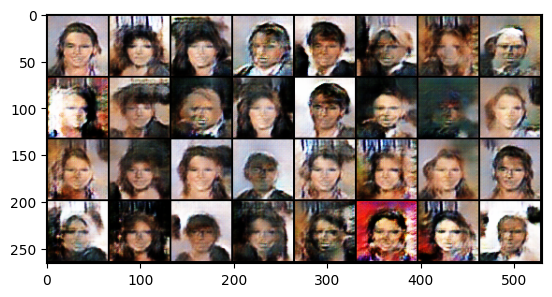

In [24]:
# Create samples
noise = torch.randn(32, z_dim, 1, 1).to(device)
with torch.no_grad():
  fake = model(fixed_noise)
  img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
  pl.imshow(img_grid_fake.detach().cpu().permute(1, 2, 0).numpy())
  pl.show()